In [1]:
X_cols_names = ['ambient', 'coolant', 'u_d', 'u_q', 'motor_speed', 'torque', 'i_d', 'i_q']
y_cols_names = ['pm', 'stator_yoke', 'stator_tooth', 'stator_winding']

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import altair as alt
import random

alt.data_transformers.enable("vegafusion")

pd.options.display.float_format = '{:.2f}'.format
df = pd.read_csv("measures_v2.csv")
df


,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.45,18.81,19.09,-0.35,18.29,0.00,0.00,0.00,24.55,18.32,19.85,0.19,17
1,-0.33,18.82,19.09,-0.31,18.29,0.00,0.00,-0.00,24.54,18.31,19.85,0.25,17
2,-0.44,18.83,19.09,-0.37,18.29,0.00,0.00,0.00,24.54,18.33,19.85,0.18,17
3,-0.33,18.84,19.08,-0.32,18.29,0.01,0.00,0.00,24.55,18.33,19.85,0.24,17
4,-0.47,18.86,19.08,-0.33,18.29,0.00,-0.06,0.04,24.57,18.33,19.85,0.21,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1330811,-2.15,30.72,45.27,0.79,41.93,0.00,-2.00,1.10,62.15,38.65,23.99,-0.00,71
1330812,-2.26,30.72,45.24,0.78,41.87,0.00,-2.00,1.10,62.14,38.66,23.97,-0.00,71
1330813,-2.13,30.72,45.21,0.80,41.80,0.00,-2.00,1.10,62.14,38.65,23.98,-0.00,71
1330814,-2.27,30.72,45.19,0.76,41.76,0.01,-2.00,1.10,62.13,38.66,24.00,-0.00,71


In [3]:
len(df.profile_id.unique()), df.profile_id.min(), df.profile_id.max()

(69, 2, 81)

In [4]:
profile_group = df.groupby("profile_id").size().reset_index()
profile_group.columns = ["profile_id", "size"]
alt.Chart(profile_group).mark_bar().encode(x="profile_id:N", y="size:Q", tooltip="profile_id")

alt.Chart(...)

In [5]:
df.drop(["profile_id"], axis="columns").corr().style.background_gradient(cmap='coolwarm')

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque
u_q,1.000000,0.051721,0.050610,0.004702,0.104373,0.683556,-0.100357,-0.124589,0.122365,0.090992,0.150264,-0.136215
coolant,0.051721,1.000000,0.504835,0.195517,0.674974,0.011872,0.074865,-0.256389,0.467117,0.860750,0.525963,-0.257982
stator_winding,0.050610,0.504835,1.000000,-0.234950,0.970135,0.432034,-0.624370,0.065617,0.795893,0.860268,0.333208,0.095510
u_d,0.004702,0.195517,-0.234950,1.000000,-0.142749,-0.288472,0.448331,-0.723069,-0.172031,-0.008098,0.203647,-0.753779
stator_tooth,0.104373,0.674974,0.970135,-0.142749,1.000000,0.398431,-0.487062,-0.042294,0.832084,0.953115,0.443470,-0.018413
motor_speed,0.683556,0.011872,0.432034,-0.288472,0.398431,1.000000,-0.700609,-0.068881,0.458947,0.255790,0.118232,-0.043903
i_d,-0.100357,0.074865,-0.624370,0.448331,-0.487062,-0.700609,1.000000,-0.231344,-0.427736,-0.278005,0.016397,-0.274097
i_q,-0.124589,-0.256389,0.065617,-0.723069,-0.042294,-0.068881,-0.231344,1.000000,-0.142416,-0.131466,-0.314044,0.996457
pm,0.122365,0.467117,0.795893,-0.172031,0.832084,0.458947,-0.427736,-0.142416,1.000000,0.756684,0.513728,-0.117138
stator_yoke,0.090992,0.860750,0.860268,-0.008098,0.953115,0.255790,-0.278005,-0.131466,0.756684,1.000000,0.520382,-0.117118


In [6]:
X_cols = df[X_cols_names]
Y_cols = df[y_cols_names]
X_cols

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q
0,19.85,18.81,-0.35,-0.45,0.00,0.19,0.00,0.00
1,19.85,18.82,-0.31,-0.33,0.00,0.25,0.00,-0.00
2,19.85,18.83,-0.37,-0.44,0.00,0.18,0.00,0.00
3,19.85,18.84,-0.32,-0.33,0.01,0.24,0.00,0.00
4,19.85,18.86,-0.33,-0.47,0.00,0.21,-0.06,0.04
...,...,...,...,...,...,...,...,...
1330811,23.99,30.72,0.79,-2.15,0.00,-0.00,-2.00,1.10
1330812,23.97,30.72,0.78,-2.26,0.00,-0.00,-2.00,1.10
1330813,23.98,30.72,0.80,-2.13,0.00,-0.00,-2.00,1.10
1330814,24.00,30.72,0.76,-2.27,0.01,-0.00,-2.00,1.10


In [7]:
Y_cols.describe()

,pm,stator_yoke,stator_tooth,stator_winding
count,1330816.00,1330816.00,1330816.00,1330816.00
mean,58.51,48.19,56.88,66.34
std,19.00,19.99,22.95,28.67
min,20.86,18.08,18.13,18.59
25%,43.15,31.99,38.42,42.79
50%,60.27,45.63,56.04,65.11
75%,72.01,61.46,75.59,88.14
max,113.61,101.15,111.95,141.36


In [8]:
X_cols.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q
count,1330816.00,1330816.00,1330816.00,1330816.00,1330816.00,1330816.00,1330816.00,1330816.00
mean,24.57,36.23,-25.13,54.28,2202.08,31.11,-68.72,37.41
std,1.93,21.79,63.09,44.17,1859.66,77.14,64.93,92.18
min,8.78,10.62,-131.53,-25.29,-275.55,-246.47,-278.00,-293.43
25%,23.18,18.70,-78.69,12.07,317.11,-0.14,-115.41,1.10
50%,24.80,26.90,-7.43,48.94,1999.98,10.86,-51.09,15.77
75%,26.22,49.86,1.47,90.03,3760.64,91.60,-2.98,100.61
max,30.71,101.60,131.47,133.04,6000.02,261.01,0.05,301.71


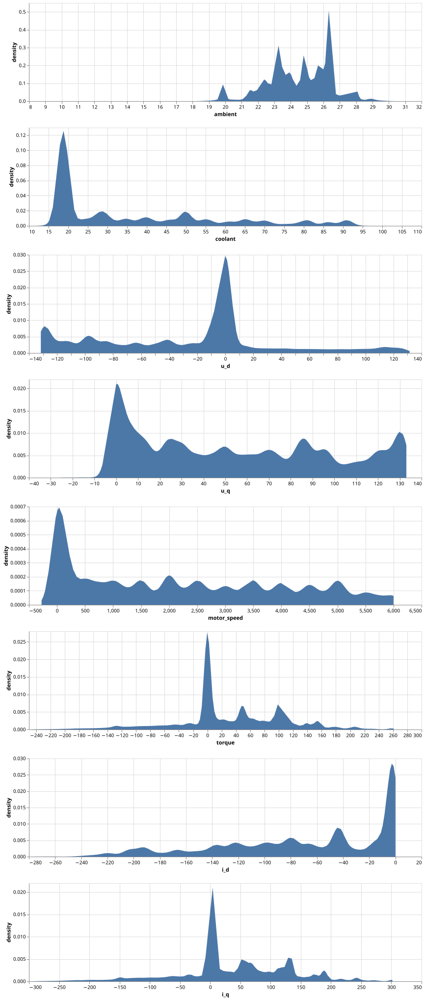

In [9]:
charts = []

for i, column in enumerate(X_cols.columns):

    charts.append(alt.Chart(X_cols).transform_density(
        column,
        as_=[column, 'density'],
    ).mark_area().encode(
        x=f"{column}:Q",
        y='density:Q',
    ).properties(
        width=800,
        height=200))

# alt.vconcat(*charts)

from IPython.display import SVG, display
display(SVG("visualization.svg"))Ф


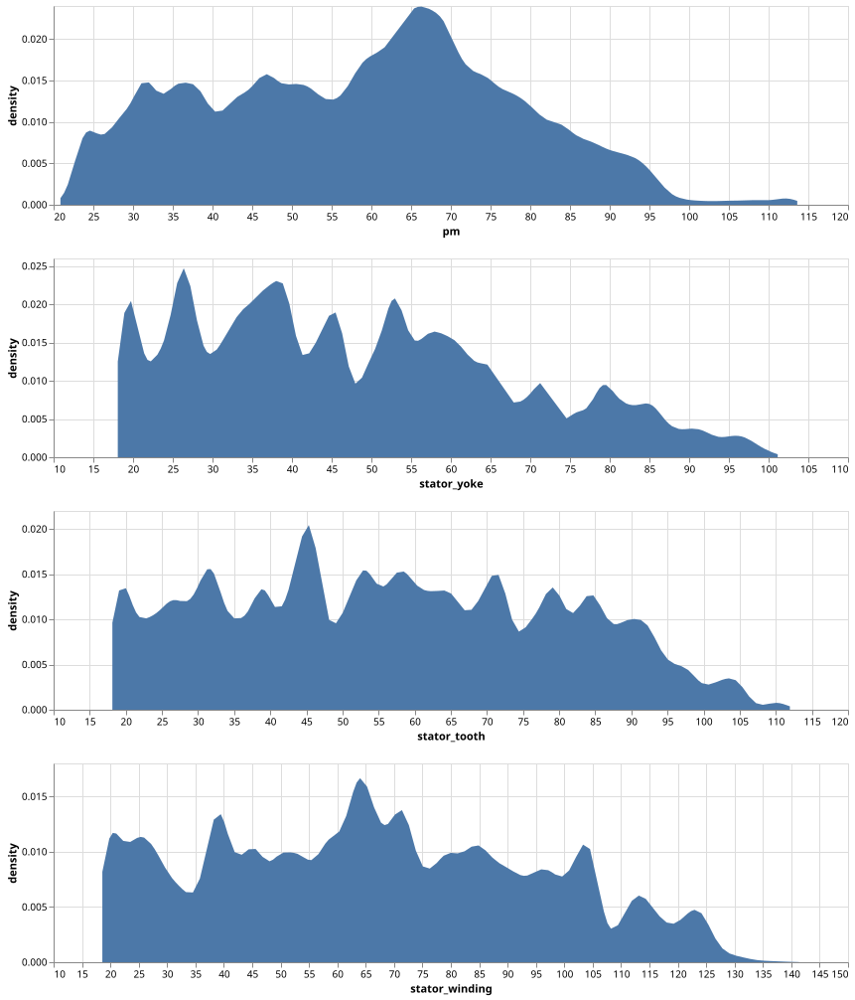

In [10]:
charts = []

for i, column in enumerate(Y_cols.columns):

    charts.append(alt.Chart(Y_cols).transform_density(
        column,
        as_=[column, 'density'],
    ).mark_area().encode(
        x=f"{column}:Q",
        y='density:Q',
    ).properties(
        width=800,
        height=200))

# alt.vconcat(*charts)
display(SVG("visualization_y_cols.svg"))


In [11]:
ten_random_profiles = random.choices(list(df["profile_id"].unique()), k=10)
ten_random_profiles

[6, 65, 59, 31, 36, 43, 73, 18, 67, 32]

In [12]:
ten_profiles_target_df = df[df.profile_id.isin(ten_random_profiles)][y_cols_names + ["profile_id"]]
ten_profiles_target_df

def get_line_chart(df_name, y_col, color):
    return alt.Chart(df_name).mark_line(color=color).encode(x="time_id", y=y_col)

charts = []

for profile_id in ten_random_profiles:
    profile_df = df[df.profile_id == profile_id][y_cols_names].reset_index()
    profile_df["time_id"] = profile_df.index
    df_to_plot = profile_df[y_cols_names + ["time_id"]].melt(id_vars=["time_id"])
    charts.append(
        alt.Chart(df_to_plot).mark_line().encode(x="time_id", y="value:Q", color="variable").properties(
        width=800,
        height=200)
    )
   
# alt.vconcat(*charts)
display(SVG("visualization_y_cols_profiles.svg"))

In [14]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaled_df = df
scaled_df[X_cols_names] = pd.DataFrame(scaler.fit_transform(df[X_cols_names]), columns=df.columns.drop(["profile_id"] + y_cols_names))

# picking 3 profiles for the test set:
test_profiles = [4, 27, 62]
test_df = scaled_df[scaled_df.profile_id.isin(test_profiles)]
train_df = scaled_df[~ scaled_df.profile_id.isin(test_profiles)]
len(test_df), len(train_df), len(test_df) / (len(test_df) + len(train_df))


(94385, 1236431)

In [15]:
X_train, y_train = train_df[X_cols_names], train_df["pm"]
X_test, y_test = test_df[X_cols_names], test_df["pm"]


X_train

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q
0,-2.44,-0.80,0.39,-1.24,-1.18,-0.40,1.06,-0.41
1,-2.44,-0.80,0.39,-1.24,-1.18,-0.40,1.06,-0.41
2,-2.44,-0.80,0.39,-1.24,-1.18,-0.40,1.06,-0.41
3,-2.44,-0.80,0.39,-1.24,-1.18,-0.40,1.06,-0.41
4,-2.44,-0.80,0.39,-1.24,-1.18,-0.40,1.06,-0.41
...,...,...,...,...,...,...,...,...
1330811,-0.30,-0.25,0.41,-1.28,-1.18,-0.40,1.03,-0.39
1330812,-0.31,-0.25,0.41,-1.28,-1.18,-0.40,1.03,-0.39
1330813,-0.30,-0.25,0.41,-1.28,-1.18,-0.40,1.03,-0.39
1330814,-0.29,-0.25,0.41,-1.28,-1.18,-0.40,1.03,-0.39


In [16]:
X_test

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q
110332,-0.48,-0.86,0.42,-1.25,-1.18,-0.40,1.03,-0.39
110333,-0.49,-0.86,0.42,-1.25,-1.18,-0.40,1.03,-0.39
110334,-0.51,-0.86,0.42,-1.25,-1.18,-0.40,1.03,-0.39
110335,-0.50,-0.86,0.42,-1.25,-1.18,-0.40,1.03,-0.40
110336,-0.50,-0.86,0.42,-1.25,-1.18,-0.40,1.03,-0.39
...,...,...,...,...,...,...,...,...
1042489,-0.17,-0.37,0.40,-1.20,-1.18,-0.40,1.03,-0.39
1042490,-0.18,-0.37,0.41,-1.20,-1.18,-0.40,1.03,-0.39
1042491,-0.18,-0.37,0.40,-1.20,-1.18,-0.40,1.03,-0.39
1042492,-0.19,-0.37,0.40,-1.20,-1.18,-0.40,1.03,-0.39


In [17]:
lr_parameters = {
              "fit_intercept": [True, False],
             }


rf_params = {
                'bootstrap': [True, False],
                'max_depth': [10, 20, 30, 40, 50],
                'max_features': ['auto', 'sqrt'],
                'min_samples_leaf': [1, 2, 4],
                'min_samples_split': [2, 5, 10],
                'n_estimators': [200, 400, 600, 800, 1000]
            }



In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error as mse

lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)

mse(y_test, y_pred)

199.0553848171118

In [19]:
from sklearn.model_selection import RandomizedSearchCV
randomizedsearch = RandomizedSearchCV(lr, lr_parameters, n_iter=2)
best_model_random = randomizedsearch.fit(X_train, y_train)
print(best_model_random.best_estimator_)

LinearRegression()


In [20]:
# y_pred = best_model_random.best_estimator_.predict(X_test)
# mse(y_test, y_pred)

199.0553848171118

In [21]:
from xgboost.sklearn import XGBRegressor

xgb1 = XGBRegressor()
xgb_parameters = {
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 5, 7]
    }

In [22]:
from sklearn.model_selection import RandomizedSearchCV
randomizedsearch = RandomizedSearchCV(xgb1, xgb_parameters, n_iter=20, verbose=2, n_jobs=-1)
best_model_random = randomizedsearch.fit(X_train, y_train)
print(best_model_random.best_estimator_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=1, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)


In [23]:
y_pred = best_model_random.best_estimator_.predict(X_test)
mse(y_test, y_pred)

195.37965482492675

In [24]:
def create_lag_feature(df, feature_name, n_lags=2):
    names = []
    for lag in range(n_lags):
        df[f"{feature_name}_lag_{lag + 1}"] = df[f"{feature_name}"].shift(lag + 1)
        names.append(f"{feature_name}_lag_{lag + 1}")
    return df, names


In [25]:
scaled_df_lagged, f_names = create_lag_feature(scaled_df, "pm", 10)

test_df = scaled_df_lagged[scaled_df_lagged.profile_id.isin(test_profiles)]
train_df = scaled_df_lagged[~ scaled_df_lagged.profile_id.isin(test_profiles)]

test_df = test_df.apply(lambda x: x.fillna(x.mean()), axis=0)
train_df = train_df.apply(lambda x: x.fillna(x.mean()), axis=0)

In [26]:
scaled_df_lagged

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,...,pm_lag_1,pm_lag_2,pm_lag_3,pm_lag_4,pm_lag_5,pm_lag_6,pm_lag_7,pm_lag_8,pm_lag_9,pm_lag_10
0,-1.24,-0.80,19.09,0.39,18.29,-1.18,1.06,-0.41,24.55,18.32,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1.24,-0.80,19.09,0.39,18.29,-1.18,1.06,-0.41,24.54,18.31,...,24.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-1.24,-0.80,19.09,0.39,18.29,-1.18,1.06,-0.41,24.54,18.33,...,24.54,24.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-1.24,-0.80,19.08,0.39,18.29,-1.18,1.06,-0.41,24.55,18.33,...,24.54,24.54,24.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-1.24,-0.80,19.08,0.39,18.29,-1.18,1.06,-0.41,24.57,18.33,...,24.55,24.54,24.54,24.55,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1330811,-1.28,-0.25,45.27,0.41,41.93,-1.18,1.03,-0.39,62.15,38.65,...,62.17,62.18,62.18,62.19,62.20,62.19,62.19,62.20,62.22,62.24
1330812,-1.28,-0.25,45.24,0.41,41.87,-1.18,1.03,-0.39,62.14,38.66,...,62.15,62.17,62.18,62.18,62.19,62.20,62.19,62.19,62.20,62.22
1330813,-1.28,-0.25,45.21,0.41,41.80,-1.18,1.03,-0.39,62.14,38.65,...,62.14,62.15,62.17,62.18,62.18,62.19,62.20,62.19,62.19,62.20
1330814,-1.28,-0.25,45.19,0.41,41.76,-1.18,1.03,-0.39,62.13,38.66,...,62.14,62.14,62.15,62.17,62.18,62.18,62.19,62.20,62.19,62.19


In [27]:
X_train, y_train = train_df[X_cols_names + f_names], train_df["pm"]
X_test, y_test = test_df[X_cols_names + f_names], test_df["pm"]


In [28]:
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)

format(mse(y_test, y_pred), "f")

'0.022297'

In [29]:
from sklearn.model_selection import RandomizedSearchCV
randomizedsearch = RandomizedSearchCV(xgb1, xgb_parameters, n_iter=20, verbose=2, n_jobs=-1)
best_model_random = randomizedsearch.fit(X_train, y_train)
print(best_model_random.best_estimator_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.6, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=5, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)


In [30]:
y_pred = best_model_random.best_estimator_.predict(X_test)
mse(y_test, y_pred)

0.6013733298081263